# 11. Correlation analysis: numeric variables

In [1]:
library(tidyverse)
library(data.table)
library(reshape2)
library(ggplot2)
library(RColorBrewer)
library(vegan)
library(dplyr) 
library(ggpubr)
library(Hmisc)
library(corrplot)
library(ggpmisc)
library(scales)
library(broom)
library(grid)
library(png)
library(forcats)
library(gridExtra)
library(tibble)

── Attaching core tidyverse packages ────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ──────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘data.table’


The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose



A

In [2]:
setwd("/home/strawberry/Documents/Collaborations/sinusite_edwin/data")
ReadCounts_TaxAnnotation <- read.delim("./ReadCounts_TaxAnnotation_SILVA.tsv")
metadata_filtered <- read.delim("./metadata_filtered_Diversity.tsv")
staph_species_plot <- read.delim("./staph_species_plot.tsv")

head(ReadCounts_TaxAnnotation)
head(metadata_filtered)
head(staph_species_plot)

,ID_Sample,id,count,Kingdom,Phylum,Class,Order,Family,Genus,Species,⋯,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay,AlignmentEfficiency
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>
1,0001967K_T1,AB646616,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus saccharolyticus,⋯,1,58.7,1,1,0,38,100,10,15,99.85097
2,0001967K_T1,AF015929,4,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus aureus,⋯,1,58.7,1,1,0,38,100,10,15,99.85097
3,0001967K_T1,AGEF01000005,1,Bacteria,Bacillota,Bacilli,Lactobacillales,Carnobacteriaceae,Dolosigranulum,Dolosigranulum pigrum ATCC 51524,⋯,1,58.7,1,1,0,38,100,10,15,99.85097
4,0001967K_T1,AIYD01000002,2,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus aureus M1016,⋯,1,58.7,1,1,0,38,100,10,15,99.85097
5,0001967K_T1,AJ439343,1,Bacteria,Actinomycetota,Actinobacteria,Mycobacteriales,Corynebacteriaceae,Corynebacterium,Corynebacterium pseudodiphtheriticum,⋯,1,58.7,1,1,0,38,100,10,15,99.85097
6,0001967K_T1,AJ938182,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus aureus RF122,⋯,1,58.7,1,1,0,38,100,10,15,99.85097


,ID_Sample,SNOT22,SNOT22nasal,LK_Total,LK_Secret,ClinicCtrl,AntUse,Cortuse,Patient,Filename,⋯,Timepoint,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay
,<chr>,<int>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
1,0001967K_T1,38,12,4,2,NC,1,1,0001967K,0001967K_T1.fastq,⋯,T1,1,58.7,1,1,0,38,100,10,15
2,0001967K_T3,96,26,10,4,NC,1,0,0001967K,0001967K_T3.fastq,⋯,T3,1,58.7,1,1,0,38,100,10,15
3,0001967K_T6,79,19,6,4,NC,1,1,0001967K,0001967K_T6.fastq,⋯,T6,1,58.7,1,1,0,38,100,10,15
4,0088303G_T0,102,37,8,2,NC,NA,0,0088303G,0088303G_T0.fastq,⋯,T0,2,60.3,1,1,0,667,800,58,22
5,0088303G_T1,32,7,4,1,NC,1,0,0088303G,0088303G_T1.fastq,⋯,T1,2,60.3,1,1,0,667,800,58,22
6,0088303G_T3,NA,NA,NA,NA,NA,0,0,0088303G,0088303G_T3.fastq,⋯,T3,2,60.3,1,1,0,667,800,58,22


,ID_Sample,Timepoint,Taxa_clean,RelativeAbundance
,<chr>,<chr>,<chr>,<dbl>
1,0001967K_T1,T1,Staphylococcus argenteus,0.59594756
2,0001967K_T1,T1,Staphylococcus aureus,95.70917759
3,0001967K_T1,T1,Staphylococcus epidermidis,0.20858164
4,0001967K_T1,T1,Staphylococcus saccharolyticus,0.02979738
5,0001967K_T1,T1,Staphylococcus sp.,0.08939213
6,0001967K_T3,T3,Staphylococcus argenteus,0.61418811


In [20]:
# Keep only those patients with data across all samples --> WON'T DO THIS, OTHERWISE NOTHING IS STATISTICALLY SIGNIFICANT

## Replace NA in AntUse column with 0
metadata_filtered$AntUse[is.na(metadata_filtered$AntUse)] <- 0

## Filter metadata for patients with no NA in any column
complete_meta <- metadata_filtered[complete.cases(metadata_filtered), ]
head(complete_meta)

## Get the unique patient IDs with full metadata
complet_metad_pat <- unique(complete_meta$Patient)
print(complet_metad_pat)

## Filter out those patients from ReadCounts_TaxAnnotation
ReadCounts_corr <- ReadCounts_TaxAnnotation[!ReadCounts_TaxAnnotation$Patient %in% complet_metad_pat, ]
head(ReadCounts_corr)

## Check the resulting dimensions
print(dim(ReadCounts_TaxAnnotation))  # before filtering
print(dim(ReadCounts_corr))       # after filtering

,ID_Sample,SNOT22,SNOT22nasal,LK_Total,LK_Secret,ClinicCtrl,AntUse,Cortuse,Patient,Filename,⋯,Timepoint,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay
,<chr>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
1,0001967K_T1,38,12,4,2,NC,1,1,0001967K,0001967K_T1.fastq,⋯,T1,1,58.7,1,1,0,38,100,10,15
2,0001967K_T3,96,26,10,4,NC,1,0,0001967K,0001967K_T3.fastq,⋯,T3,1,58.7,1,1,0,38,100,10,15
3,0001967K_T6,79,19,6,4,NC,1,1,0001967K,0001967K_T6.fastq,⋯,T6,1,58.7,1,1,0,38,100,10,15
4,0088303G_T0,102,37,8,2,NC,0,0,0088303G,0088303G_T0.fastq,⋯,T0,2,60.3,1,1,0,667,800,58,22
5,0088303G_T1,32,7,4,1,NC,1,0,0088303G,0088303G_T1.fastq,⋯,T1,2,60.3,1,1,0,667,800,58,22
7,0110059G_T0,53,15,8,2,NC,0,0,0110059G,0110059G_T0.fastq,⋯,T0,1,61.0,1,0,0,35,600,320,22


 [1] "0001967K" "0088303G" "0110059G" "0130765A" "0207720E" "0236549G"
 [7] "0313863D" "0332596H" "0492882D" "0514164A" "0689227I" "0732163H"
[13] "0780068I" "0784533E" "0878122D" "0974256K" "0980601G" "0990961D"
[19] "1190552D" "1272679D" "1377897D" "1427495A" "1512536E" "1526680J"
[25] "1532317F" "1552332D" "1553248E" "1557602I" "1560534I" "1562839D"
[31] "1567252D" "1571955H" "1578804D" "1605228B" "1618827B" "1628845C"
[37] "1654702B" "1668337K"


,ID_Sample,id,count,Kingdom,Phylum,Class,Order,Family,Genus,Species,⋯,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay,AlignmentEfficiency
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>
36508,0584352K_T0,AB009935,5,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus caprae,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415
36509,0584352K_T0,AB009937,3,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus capitis subsp. urealyticus,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415
36510,0584352K_T0,AB233325,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus capitis subsp. urealyticus,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415
36511,0584352K_T0,AB355617,1,Bacteria,Bacillota,Bacilli,Lactobacillales,Streptococcaceae,Streptococcus,Streptococcus oralis,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415
36512,0584352K_T0,AB547676,1,Bacteria,Bacteroidota,Bacteroidia,Bacteroidales,Prevotellaceae,Hoylesella,Prevotella buccalis,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415
36513,0584352K_T0,AB638444,4,Bacteria,Actinomycetota,Actinobacteria,Propionibacteriales,Propionibacteriaceae,Cutibacterium,Cutibacterium granulosum,⋯,2,58.6,0,0,0,NA,200,5,11,99.98415


[1] 152327     33
[1] 10128    33


In [16]:
# Correlation 1: CoPS x CoNS 
## Define your groups
CoPS <- c(
  "Staphylococcus aureus",
  "Staphylococcus argenteus",
  "Staphylococcus intermedius",
  "Staphylococcus pseudintermedius",
  "Staphylococcus delphini",
  "Staphylococcus schleiferi",
  "Staphylococcus lutrae"
)

CoNS <- c(
  "Staphylococcus epidermidis",
  "Staphylococcus saccharolyticus",
  "Staphylococcus sp.",
  "Staphylococcus auricularis",
  "Staphylococcus capitis",
  "Staphylococcus cohnii",
  "Staphylococcus gallinarum",
  "Staphylococcus haemolyticus",
  "Staphylococcus hominis",
  "Staphylococcus lugdunensis",  
  "Staphylococcus nepalensis",
  "Staphylococcus pasteuri",
  "Staphylococcus petrasii",
  "Staphylococcus saprophyticus",
  "Staphylococcus simiae",
  "Staphylococcus warneri",
  "Staphylococcus xylosus",
  "Staphylococcus caprae",
  "Staphylococcus chromogenes",
  "Staphylococcus devriesei",
  "Staphylococcus pettenkoferi",
  "Staphylococcus piscifermentans",
  "Staphylococcus sciuri",
  "Staphylococcus succinus",
  "Staphylococcus agnetis",
  "Staphylococcus simulans",
  "Staphylococcus massiliensis",
  "Staphylococcus muscae",
  "Staphylococcus lentus",
  "Staphylococcus arlettae",
  "Staphylococcus stepanovicii",
  "Staphylococcus carnosus"
)

# Add group labels to the dataframe
staph_species_labeled <- staph_species_plot %>%
  mutate(group = case_when(
    Taxa_clean %in% CoPS ~ "CoPS",
    Taxa_clean %in% CoNS ~ "CoNS",
    TRUE ~ NA_character_
  )) %>%
  filter(!is.na(group))

# Summarize relative abundances by group per sample
rel_ab_staph_grouped <- staph_species_labeled %>%
  group_by(ID_Sample, group) %>%
  summarise(RelAb = sum(RelativeAbundance), .groups = "drop") %>%
  pivot_wider(names_from = group, values_from = RelAb, values_fill = 0) %>%
  mutate(log2_ratio_CoPS_CoNS = log2((CoPS + 1e-6) / (CoNS + 1e-6)))

# View summary
head(rel_ab_staph_grouped)
head(staph_species_labeled)

ID_Sample,CoNS,CoPS,log2_ratio_CoPS_CoNS
<chr>,<dbl>,<dbl>,<dbl>
0001967K_T1,0.3277712,96.305125,8.1987755
0001967K_T3,0.6160052,97.772205,7.3103356
0001967K_T6,0.2285667,98.585916,8.7526162
0088303G_T0,61.0115237,1.808579,-5.0761527
0088303G_T1,1.3098840,97.184082,6.2132080
0088303G_T3,45.3397890,33.927027,-0.4183426


,ID_Sample,Timepoint,Taxa_clean,RelativeAbundance,group
,<chr>,<chr>,<chr>,<dbl>,<chr>
1,0001967K_T1,T1,Staphylococcus argenteus,0.59594756,CoPS
2,0001967K_T1,T1,Staphylococcus aureus,95.70917759,CoPS
3,0001967K_T1,T1,Staphylococcus epidermidis,0.20858164,CoNS
4,0001967K_T1,T1,Staphylococcus saccharolyticus,0.02979738,CoNS
5,0001967K_T1,T1,Staphylococcus sp.,0.08939213,CoNS
6,0001967K_T3,T3,Staphylococcus argenteus,0.61418811,CoPS


Warning message in cor.test.default(rel_ab_staph_grouped$CoPS, rel_ab_staph_grouped$CoNS, :
“Cannot compute exact p-value with ties”
`geom_smooth()` using formula = 'y ~ x'


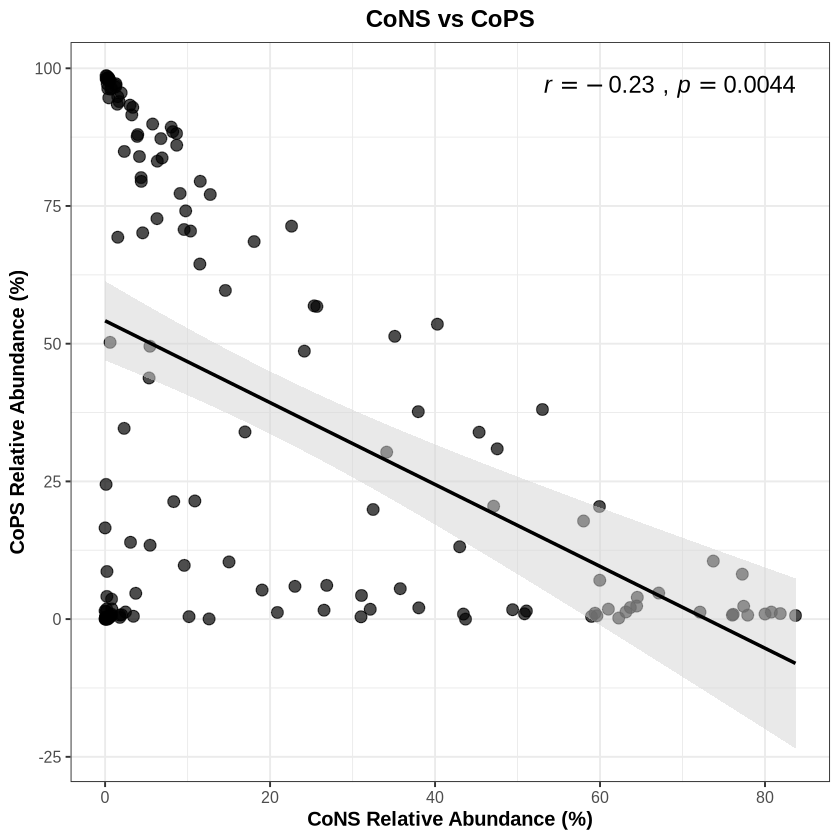

In [5]:
## Merge with metadata_filtered
merged_staph_meta <- metadata_filtered %>%
  left_join(rel_ab_staph_grouped, by = "ID_Sample")

## Spearman correlation between CoPS and CoNS relative abundances
# Correlation test (Spearman)
cor_test_cops_cons <- cor.test(rel_ab_staph_grouped$CoPS, rel_ab_staph_grouped$CoNS, method = "spearman")
cor_r <- round(cor_test_cops_cons$estimate, 2)
cor_p <- round(cor_test_cops_cons$p.value, 4)

## Plot
cops_cons_corr <- ggplot(rel_ab_staph_grouped, aes(x = CoNS, y = CoPS)) +
  geom_point(color = "black", size = 3, alpha = 0.7) +
  geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
  theme_bw(base_size = 12) +
  labs(
    title = "CoNS vs CoPS",
    x = "CoNS Relative Abundance (%)",
    y = "CoPS Relative Abundance (%)"
  ) +
  annotate(
    "text",
    x = max(rel_ab_staph_grouped$CoNS, na.rm = TRUE),
    y = max(rel_ab_staph_grouped$CoPS, na.rm = TRUE),
    label = paste0("italic(r) == ", cor_r, " ~ \",\" ~ italic(p) == ", cor_p),
    parse = TRUE,
    hjust = 1, vjust = 1,
    size = 5,
    color = "black"
  ) +
  theme(
    plot.title = element_text(face = "bold", hjust = 0.5),
    axis.title = element_text(face = "bold")
  )
print(cops_cons_corr)

In [23]:
head(merged_staph_meta)

,ID_Sample,SNOT22,SNOT22nasal,LK_Total,LK_Secret,ClinicCtrl,AntUse,Cortuse,Patient,Filename,⋯,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay,CoNS,CoPS,log2_ratio_CoPS_CoNS
,<chr>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<int>,<chr>,<chr>,⋯,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,0001967K_T1,38,12,4,2,NC,1,1,0001967K,0001967K_T1.fastq,⋯,1,1,0,38,100,10,15,0.3277712,96.305125,8.1987755
2,0001967K_T3,96,26,10,4,NC,1,0,0001967K,0001967K_T3.fastq,⋯,1,1,0,38,100,10,15,0.6160052,97.772205,7.3103356
3,0001967K_T6,79,19,6,4,NC,1,1,0001967K,0001967K_T6.fastq,⋯,1,1,0,38,100,10,15,0.2285667,98.585916,8.7526162
4,0088303G_T0,102,37,8,2,NC,0,0,0088303G,0088303G_T0.fastq,⋯,1,1,0,667,800,58,22,61.0115237,1.808579,-5.0761527
5,0088303G_T1,32,7,4,1,NC,1,0,0088303G,0088303G_T1.fastq,⋯,1,1,0,667,800,58,22,1.3098840,97.184082,6.2132080
6,0088303G_T3,NA,NA,NA,NA,NA,0,0,0088303G,0088303G_T3.fastq,⋯,1,1,0,667,800,58,22,45.3397890,33.927027,-0.4183426


In [24]:
print("Number of Samples being Correlated")
length(unique(merged_staph_meta$ID_Sample))

print("Number of Patients being Correlated")
length(unique(merged_staph_meta$Patient))

[1] "Number of Samples being Correlated"


[1] 150

[1] "Number of Patients being Correlated"


[1] 41

In [6]:
df_species <- read.delim("./df_species.tsv")
head(df_species)

,Taxa,ID_Sample,Timepoint,Counts,RelAbund,Taxa_clean,Genus
,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>
1,[Propionibacterium] namnetense,0088303G_T0,T0,1,0.01600512,[Propionibacterium] namnetense,[Propionibacterium]
2,Anaerococcus octavius,0088303G_T0,T0,4,0.06402049,Anaerococcus octavius,Anaerococcus
3,bacterium,0088303G_T0,T0,8,0.12804097,NA,bacterium
4,bacterium 1-gw1-3,0088303G_T0,T0,9,0.14404609,bacterium 1-gw1-3,bacterium
5,bacterium HKG213,0088303G_T0,T0,16,0.25608195,bacterium HKG213,bacterium
6,bacterium N47,0088303G_T0,T0,21,0.33610755,bacterium N47,bacterium


In [7]:
# Correlate: ratio CoPS/CoNS x clinical parameters

## 1. Numeric variables
num_vars_to_corr <- c("SNOT22", "SNOT22nasal", "LK_Total", "LK_Secret",
                      "Final_LundMackay", "Total_IgE", 
                      "Blood_Eosinophilia", "Tissue_Eosinophilia")

## Correlation for numeric variables (Spearman)
cor_num_results <- lapply(num_vars_to_corr, function(var) {
  df <- merged_staph_meta[, c("log2_ratio_CoPS_CoNS", var)]
  df <- df[complete.cases(df), ]
  
  if (!is.numeric(df[[2]]) || nrow(df) < 3) {
    return(data.frame(Variable = var, Rho = NA, P_value = NA))
  }
  
  test <- cor.test(df[[1]], df[[2]], method = "spearman")
  data.frame(Variable = var, Test = "Spearman", 
             Stat = round(test$estimate, 3), 
             P_value = round(test$p.value, 4))
})
head(cor_num_results)

Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df[[1]], df[[2]], method = "spearman"):
“Cannot compute exact p-value with ties”


,Variable,Test,Stat,P_value
,<chr>,<chr>,<dbl>,<dbl>
rho,SNOT22,Spearman,-0.012,0.8879
,Variable,Test,Stat,P_value
,<chr>,<chr>,<dbl>,<dbl>
rho,SNOT22nasal,Spearman,-0.074,0.3721
,Variable,Test,Stat,P_value
,<chr>,<chr>,<dbl>,<dbl>
rho,LK_Total,Spearman,0.099,0.2347
,Variable,Test,Stat,P_value
,<chr>,<chr>,<dbl>,<dbl>


In [27]:
## Generalized plotting function
plot_spearman_corr <- function(df, xvar, yvar, xlab = NULL, ylab = NULL, title = NULL) {
  df_sub <- df[, c(xvar, yvar)]
  df_sub <- df_sub[complete.cases(df_sub), ]
  
  # Run Spearman test
  cor_result <- cor.test(df_sub[[xvar]], df_sub[[yvar]], method = "spearman")
  rho <- round(cor_result$estimate, 3)
  pval <- round(cor_result$p.value, 4)
  
  # Plot
  p <- ggplot(df_sub, aes_string(x = xvar, y = yvar)) +
    geom_point(color = "black") +
    geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
    theme_bw(base_size = 12) +
    labs(
      title = title %||% paste0(yvar, " vs ", xvar),
      x = xlab %||% xvar,
      y = ylab %||% yvar
    ) +
    annotate("text",
             x = max(df_sub[[xvar]], na.rm = TRUE) * 0.6,
             y = max(df_sub[[yvar]], na.rm = TRUE) * 0.9,
             label = paste0("italic(rho) == ", rho, " ~ \",\" ~ italic(p) == ", pval),
             parse = TRUE,
             size = 5,
             hjust = 0
    ) +
    theme(
      plot.title = element_text(face = "bold", hjust = 0.5),
      axis.title.x = element_text(face = "bold"),
      axis.title.y = element_text(face = "bold")
    )
  
  return(p)
}

Warning message in cor.test.default(df_sub[[xvar]], df_sub[[yvar]], method = "spearman"):
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(df_sub[[xvar]], df_sub[[yvar]], method = "spearman"):
“Cannot compute exact p-value with ties”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


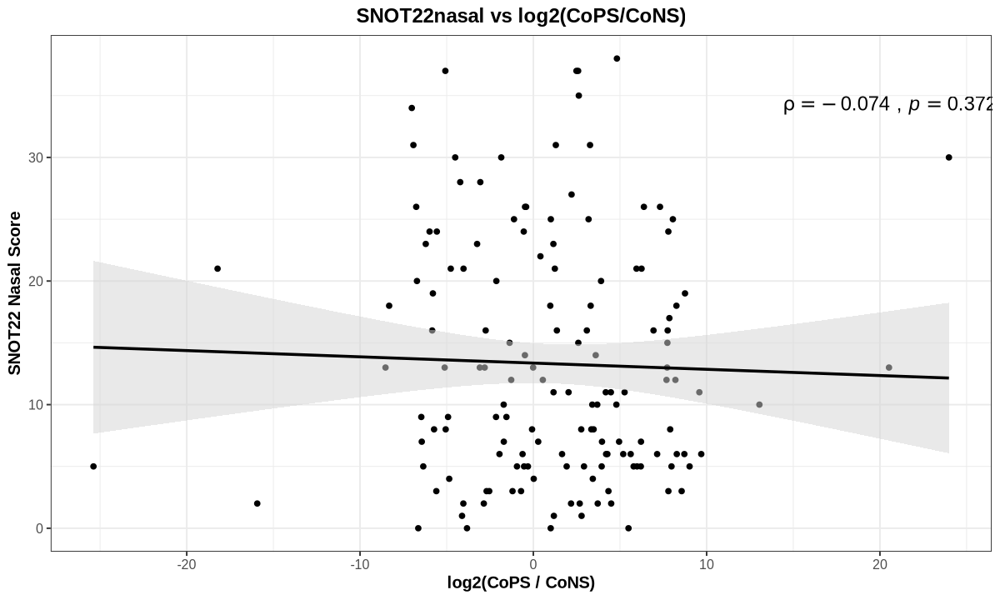

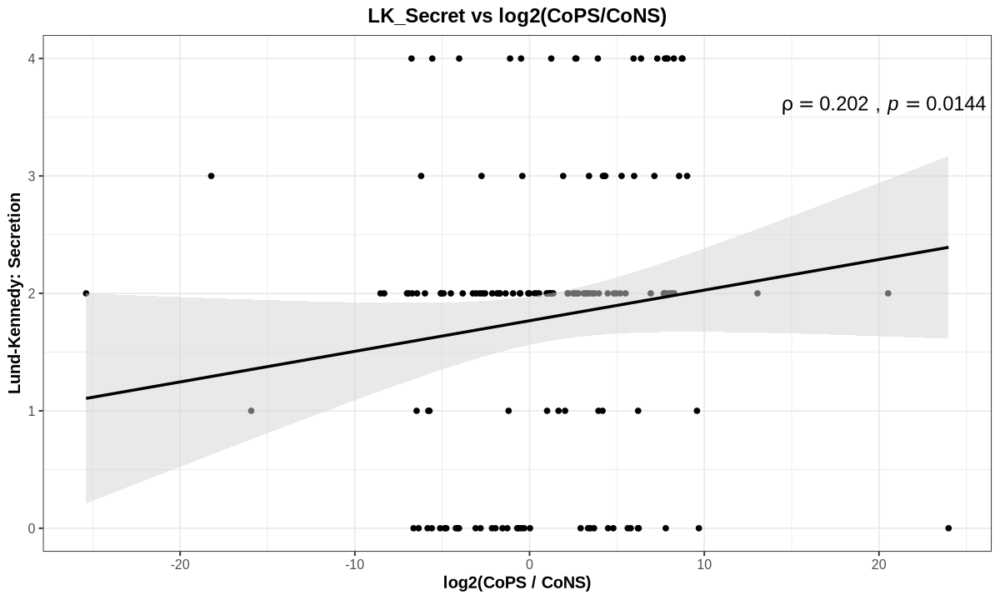

In [28]:
## Plot significant results
### SNOT22nasal
plot1 <- plot_spearman_corr(
  df = merged_staph_meta,
  xvar = "log2_ratio_CoPS_CoNS",
  yvar = "SNOT22nasal",
  xlab = "log2(CoPS / CoNS)",
  ylab = "SNOT22 Nasal Score",
  title = "SNOT22nasal vs log2(CoPS/CoNS)"
)

### LK_Secret
plot2 <- plot_spearman_corr(
  df = merged_staph_meta,
  xvar = "log2_ratio_CoPS_CoNS",
  yvar = "LK_Secret",
  xlab = "log2(CoPS / CoNS)",
  ylab = "Lund-Kennedy: Secretion",
  title = "LK_Secret vs log2(CoPS/CoNS)"
)

options(repr.plot.width = 10, repr.plot.height = 6)
print(plot1)
print(plot2)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


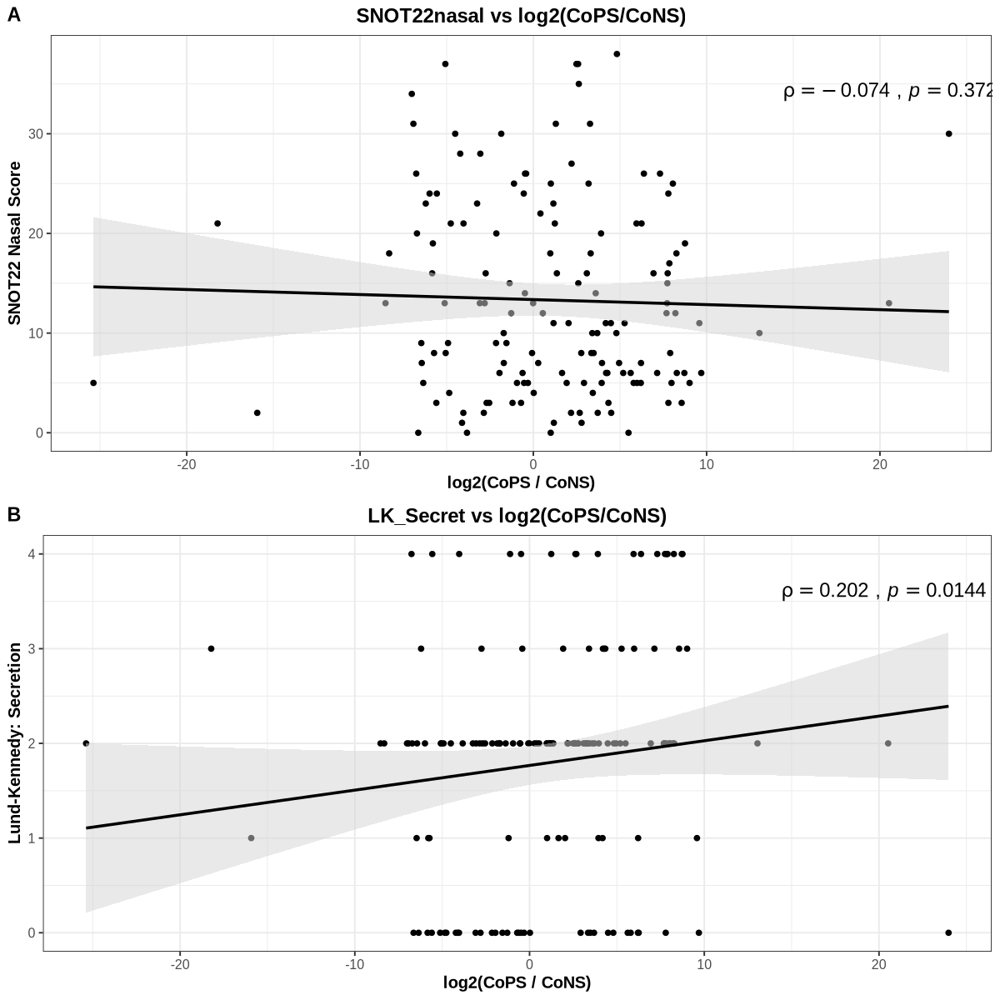

In [29]:
## Combine plots
combined_corr_grid2 <- ggarrange(
  plot1, 
  plot2, 
  labels = c("A", "B"),         # Optional: adds labels to the subplots
  ncol = 1, nrow = 2,                # 2 columns, 2 rows (one blank will be left if you have only 3 plots)
  common.legend = FALSE             # Set TRUE if you want to share a legend across plots
)

options(repr.plot.width = 10, repr.plot.height = 10)

combined_corr_grid2

In [30]:
# Correlate all microbes x all microbes
## Processing df to select the most abundant microbes 
above2.5_taxa <- ReadCounts_TaxAnnotation |> 
  filter(RelativeAbundance >= 2.5) |> 
  pull(Genus) |> 
  unique()

filtered_corr_data <- ReadCounts_TaxAnnotation |> 
  filter(Genus %in% above2.5_taxa)
print(head(filtered_corr_data))

## Split by timepoint
split_by_timepoint <- split(filtered_corr_data, filtered_corr_data$Timepoint)
head(split_by_timepoint)

## For each timepoint, summarize to avoid duplicate Genus per sample
corr_by_timepoint <- lapply(split_by_timepoint, function(df) {
  df %>%
    group_by(ID_Sample, Genus) %>%
    summarise(RelativeAbundance = sum(RelativeAbundance), .groups = "drop") %>%
    pivot_wider(names_from = Genus, values_from = RelativeAbundance) %>%
    column_to_rownames(var = "ID_Sample") %>%
    {.[is.na(.)] <- 0; .}  # replace NAs with 0
})
head(corr_by_timepoint)

    ID_Sample           id count  Kingdom         Phylum          Class
1 0001967K_T1     AB646616     1 Bacteria      Bacillota        Bacilli
2 0001967K_T1     AF015929     4 Bacteria      Bacillota        Bacilli
3 0001967K_T1 AGEF01000005     1 Bacteria      Bacillota        Bacilli
4 0001967K_T1 AIYD01000002     2 Bacteria      Bacillota        Bacilli
5 0001967K_T1     AJ439343     1 Bacteria Actinomycetota Actinobacteria
6 0001967K_T1     AJ938182     1 Bacteria      Bacillota        Bacilli
             Order             Family           Genus
1 Staphylococcales  Staphylococcaceae  Staphylococcus
2 Staphylococcales  Staphylococcaceae  Staphylococcus
3  Lactobacillales  Carnobacteriaceae  Dolosigranulum
4 Staphylococcales  Staphylococcaceae  Staphylococcus
5  Mycobacteriales Corynebacteriaceae Corynebacterium
6 Staphylococcales  Staphylococcaceae  Staphylococcus
                               Species total_aligned RelativeAbundance SNOT22
1       Staphylococcus saccharolyticus  

,ID_Sample,id,count,Kingdom,Phylum,Class,Order,Family,Genus,Species,⋯,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay,AlignmentEfficiency
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>
3648,0088303G_T0,AB009935,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus caprae,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3649,0088303G_T0,AB009937,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus capitis subsp. urealyticus,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3650,0088303G_T0,AB009943,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus piscifermentans,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3651,0088303G_T0,AB233325,1,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus capitis subsp. urealyticus,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3652,0088303G_T0,AB646616,9,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus saccharolyticus,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3653,0088303G_T0,AB680900,1,Bacteria,Bacillota,Bacilli,Lactobacillales,Carnobacteriaceae,Dolosigranulum,Dolosigranulum pigrum,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3654,0088303G_T0,AB703284,7,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus epidermidis,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3655,0088303G_T0,ACHM02000001,2,Bacteria,Bacillota,Clostridia,Peptostreptococcales-Tissierellales,Family XI,Finegoldia,Finegoldia magna ATCC 53516,⋯,2,60.3,1,1,0,667,800,58,22,60.95639
3656,0088303G_T0,AE015929,22,Bacteria,Bacillota,Bacilli,Staphylococcales,Staphylococcaceae,Staphylococcus,Staphylococcus epidermidis ATCC 12228,⋯,2,60.3,1,1,0,667,800,58,22,60.95639


,Anaerococcus,Corynebacterium,Cutibacterium,Dolosigranulum,Finegoldia,Haemophilus,Incertae Sedis,Peptoniphilus,Porphyromonas,Pseudomonas,⋯,Prevotella,Serratia,Achromobacter,Granulicatella,Moraxella,Pantoea,Citrobacter,Parvimonas,Leptotrichia,Mycoplasmoides
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0088303G_T0,0.601142170,5.68079351,0.15028554,14.93838293,0.811541930,0.18034265,1.172227232,0.72137060,0.12022843,6.011422e-02,⋯,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
0110059G_T0,11.048526863,0.51993068,5.89254766,6.15251300,5.632582322,2.72963605,0.476603120,21.49046794,0.04332756,3.466205e+00,⋯,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
0130765A_T0,10.679611650,0.82524272,1.16504854,0.04854369,5.825242718,1.79611650,1.262135922,10.77669903,0.00000000,1.470874e+01,⋯,8.25242718,0.04854369,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
0207720E_T0,0.765184122,0.00000000,0.19129603,0.11956002,0.071736011,0.00000000,0.119560019,0.28694405,0.00000000,5.260641e-01,⋯,0.07173601,0.02391200,0.02391200,0.02391200,0.09564802,0.02391200,0.00000000,0.00000000,0.00000000,0.00000000
0236549G_T0,0.718390805,25.64655172,0.86206897,2.51436782,0.143678161,0.00000000,0.143678161,0.43103448,0.00000000,5.459770e+00,⋯,0.00000000,3.01724138,0.28735632,0.00000000,0.00000000,0.00000000,0.21551724,0.00000000,0.00000000,0.00000000
0313863D_T0,0.369359242,1.18837321,0.19270917,91.77774209,0.064236390,0.01605910,0.112413682,0.24088646,0.00000000,0.000000e+00,⋯,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
0332596H_T0,0.465657742,0.00000000,0.34924331,0.69848661,0.232828871,471.12922002,0.000000000,0.58207218,0.11641444,3.492433e+00,⋯,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.11641444,0.00000000,0.00000000
0492882D_T0,0.080364318,0.00000000,0.02678811,0.02678811,0.000000000,0.00000000,0.000000000,0.02678811,0.00000000,0.000000e+00,⋯,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
0514164A_T0,0.000000000,0.09277667,1.27236581,0.00000000,0.000000000,0.49039099,0.000000000,0.00000000,0.13253810,1.948310e+00,⋯,2.06759443,0.01325381,0.00000000,0.00000000,0.00000000,0.09277667,0.00000000,0.00000000,0.00000000,0.00000000


In [9]:
# Correlate all microbes x all microbes
## Processing df to select the most abundant microbes 
above2.5_taxa <- ReadCounts_TaxAnnotation |> 
  filter(RelativeAbundance >= 2.5) |> 
  pull(Genus) |> 
  unique()

filtered_corr_data2 <- ReadCounts_TaxAnnotation |> 
  filter(Genus %in% above2.5_taxa)
print(head(filtered_corr_data2))


## Summarize to avoid duplicate Genus per sample across all timepoints
corr_general <- filtered_corr_data2 %>%
  group_by(ID_Sample, Genus) %>%
  summarise(RelativeAbundance = sum(RelativeAbundance), .groups = "drop") %>%
  pivot_wider(names_from = Genus, values_from = RelativeAbundance) %>%
  column_to_rownames(var = "ID_Sample")

# Replace NAs with 0
corr_general[is.na(corr_general)] <- 0

head(corr_general)

    ID_Sample           id count  Kingdom         Phylum          Class
1 0001967K_T1     AB646616     1 Bacteria      Bacillota        Bacilli
2 0001967K_T1     AF015929     4 Bacteria      Bacillota        Bacilli
3 0001967K_T1 AGEF01000005     1 Bacteria      Bacillota        Bacilli
4 0001967K_T1 AIYD01000002     2 Bacteria      Bacillota        Bacilli
5 0001967K_T1     AJ439343     1 Bacteria Actinomycetota Actinobacteria
6 0001967K_T1     AJ938182     1 Bacteria      Bacillota        Bacilli
             Order             Family           Genus
1 Staphylococcales  Staphylococcaceae  Staphylococcus
2 Staphylococcales  Staphylococcaceae  Staphylococcus
3  Lactobacillales  Carnobacteriaceae  Dolosigranulum
4 Staphylococcales  Staphylococcaceae  Staphylococcus
5  Mycobacteriales Corynebacteriaceae Corynebacterium
6 Staphylococcales  Staphylococcaceae  Staphylococcus
                               Species total_aligned RelativeAbundance SNOT22
1       Staphylococcus saccharolyticus  

,Corynebacterium,Dolosigranulum,Noviherbaspirillum,Peptoniphilus,Proteus,Pseudomonas,Staphylococcus,Streptococcus,Anaerococcus,Bacillus,⋯,Dialister,Prevotella,Escherichia-Shigella,Burkholderia-Caballeronia-Paraburkholderia,Peptostreptococcus,Citrobacter,Moraxella,Achromobacter,Pantoea,Leptotrichia
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0001967K_T1,0.149253731,0.1492537,0.1492537,0.14925373,1.044776119,3.28358209,489.4030,0.14925373,0.000000000,0.0000000,⋯,0,0,0,0,0,0,0,0,0,0
0001967K_T3,0.009332711,0.0000000,0.0000000,0.00000000,0.000000000,0.03733084,512.8138,0.00000000,0.046663556,0.5506300,⋯,0,0,0,0,0,0,0,0,0,0
0001967K_T6,0.000000000,0.0000000,0.0000000,0.01084089,0.003613631,0.00000000,524.5510,0.00000000,0.003613631,0.1120225,⋯,0,0,0,0,0,0,0,0,0,0
0088303G_T0,5.680793508,14.9383829,0.0000000,0.72137060,0.000000000,0.06011422,163.1199,0.09017133,0.601142170,0.0000000,⋯,0,0,0,0,0,0,0,0,0,0
0088303G_T1,0.000000000,0.0000000,0.0000000,0.01705030,0.000000000,0.06820119,512.7366,0.03410060,0.000000000,0.0000000,⋯,0,0,0,0,0,0,0,0,0,0
0088303G_T3,0.859598854,0.0000000,0.0000000,0.42979943,0.000000000,0.19102197,240.6877,0.19102197,0.000000000,3.1518625,⋯,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Save each df in the list as an individual table
for (timepoint in names(corr_by_timepoint)) {
  df <- as.data.frame(corr_by_timepoint[[timepoint]])  # ensure it's not a tibble
  filename <- paste0("Abund_by_Timepoint_4_Corr_", timepoint, ".tsv")
  write.table(df, file = filename, quote = FALSE, sep = "\t", row.names = TRUE)
}

In [31]:
## Calculate correlation matrix (Spearman)
cor_results <- lapply(corr_by_timepoint, function(df) {
  mat <- as.matrix(df)
  rcorr_res <- rcorr(mat, type = "spearman")
  
  list(
    cor = rcorr_res$r,
    pval = rcorr_res$P
  )
})

head(cor_results)

,Anaerococcus,Corynebacterium,Cutibacterium,Dolosigranulum,Finegoldia,Haemophilus,Incertae Sedis,Peptoniphilus,Porphyromonas,Pseudomonas,⋯,Prevotella,Serratia,Achromobacter,Granulicatella,Moraxella,Pantoea,Citrobacter,Parvimonas,Leptotrichia,Mycoplasmoides
Anaerococcus,1.000000000,0.56787797,0.753999230,0.18392310,0.85480038,0.434134625,0.43021362,0.94107191,0.064901420,0.302075401,⋯,0.084186316,0.27314597,0.13956488,0.1334886836,0.10282366,-0.001754686,0.136446882,0.13940508,0.15628300,0.17191130
Corynebacterium,0.567877969,1.00000000,0.608558505,0.46296384,0.60046406,0.232465620,0.32805416,0.58951315,-0.006246090,0.322878229,⋯,-0.131105088,0.15325012,0.13241853,0.1089958390,0.03743878,-0.133098797,0.173949217,0.16469660,0.10949572,0.01564225
Cutibacterium,0.753999230,0.60855850,1.000000000,0.26174528,0.65754917,0.291085792,0.30545474,0.75312463,-0.032185734,0.435245804,⋯,-0.080119776,0.29708348,0.21460174,0.0888251319,0.20962419,0.118923336,0.319400370,0.10362932,0.28156043,0.09385348
Dolosigranulum,0.183923095,0.46296384,0.261745285,1.00000000,0.27648102,0.272463613,0.33852979,0.23906268,-0.033164394,0.388827545,⋯,-0.346913543,0.14014181,0.08131906,0.2628016736,0.16028389,-0.131978894,0.237932024,0.02301371,0.25100903,-0.14119258
Finegoldia,0.854800380,0.60046406,0.657549170,0.27648102,1.00000000,0.455243475,0.39036784,0.90646406,0.099701503,0.250579870,⋯,-0.059929242,0.20668045,0.01937178,0.1201767927,-0.01746684,-0.104278483,0.020707386,0.08467842,0.17191130,0.20316790
Haemophilus,0.434134625,0.23246562,0.291085792,0.27246361,0.45524348,1.000000000,0.14748810,0.47329683,0.370778606,0.284002522,⋯,0.072090627,0.15723081,0.02463982,-0.0803104072,-0.07733016,0.045432882,0.164987574,0.32864613,-0.18455839,0.01604856
Incertae Sedis,0.430213619,0.32805416,0.305454739,0.33852979,0.39036784,0.147488102,1.00000000,0.39923629,0.267911527,0.165809655,⋯,0.201837933,0.32506256,0.21206515,0.2170017799,0.26306237,0.095650088,0.084921909,-0.08210370,0.00000000,-0.07940646
Peptoniphilus,0.941071909,0.58951315,0.753124628,0.23906268,0.90646406,0.473296828,0.39923629,1.00000000,0.091780780,0.301868825,⋯,-0.049842784,0.22995112,0.07843760,0.0655085348,-0.02754307,-0.081163923,0.096227226,0.09326639,0.20334920,0.18770695
Porphyromonas,0.064901420,-0.00624609,-0.032185734,-0.03316439,0.09970150,0.370778606,0.26791153,0.09178078,1.000000000,0.007862725,⋯,0.379815647,-0.01837748,-0.03019587,0.1727295757,0.04215183,0.280806294,-0.278971973,0.31781328,-0.10622142,-0.10622142
Pseudomonas,0.302075401,0.32287823,0.435245804,0.38882755,0.25057987,0.284002522,0.16580965,0.30186883,0.007862725,1.000000000,⋯,0.026992224,0.44623276,0.31110642,0.1809812063,0.14464234,0.193689485,0.190233824,0.22539377,0.06256898,0.01564225


In [10]:
# Calculate correlation matrix (Spearman)
## Convert corr_general to matrix
mat <- as.matrix(corr_general)

## Calculate Spearman correlation
rcorr_res <- rcorr(mat, type = "spearman")

## Store the results
cor_results <- list(
  cor = rcorr_res$r,
  pval = rcorr_res$P
)

## View correlation matrix
head(cor_results$cor)

## View p-value matrix
head(cor_results$pval)

,Corynebacterium,Dolosigranulum,Noviherbaspirillum,Peptoniphilus,Proteus,Pseudomonas,Staphylococcus,Streptococcus,Anaerococcus,Bacillus,⋯,Dialister,Prevotella,Escherichia-Shigella,Burkholderia-Caballeronia-Paraburkholderia,Peptostreptococcus,Citrobacter,Moraxella,Achromobacter,Pantoea,Leptotrichia
Corynebacterium,1.00000000,0.52866032,0.04640101,0.56425789,0.2776910,0.2213301,-0.203651898,0.29619444,0.54824743,0.23644593,⋯,0.27883122,0.1630603,0.24724266,0.13898377,0.06869678,0.187577011,0.08186900,0.15915206,0.06492133,0.09873294
Dolosigranulum,0.52866032,1.00000000,0.02779002,0.37962253,0.2790219,0.2039640,-0.229485657,0.37500569,0.37177327,0.03140539,⋯,0.05477638,0.1226200,0.12525329,0.14337834,0.08116699,0.008086745,0.17335516,0.14643885,-0.04386421,0.16438780
Noviherbaspirillum,0.04640101,0.02779002,1.00000000,0.02549229,0.1002117,0.1186281,-0.003717394,0.01083701,-0.01135212,0.11531026,⋯,0.15352103,0.1835578,0.05372912,0.24437038,0.11710554,-0.073764367,0.05947486,-0.03769460,-0.04242009,-0.02951109
Peptoniphilus,0.56425789,0.37962253,0.02549229,1.00000000,0.3639750,0.2291174,-0.162047077,0.33116617,0.86375877,0.20322463,⋯,0.39089626,0.2154276,0.15627296,0.07898272,0.09291509,0.103836773,0.14252774,0.09797514,0.05934304,0.12524289
Proteus,0.27769100,0.27902188,0.10021168,0.36397496,1.0000000,0.1884310,-0.107179338,0.27116547,0.30875005,0.12510407,⋯,0.18174547,0.1761966,0.26466895,0.05947518,0.03417311,0.071118151,0.01423568,0.22624801,0.11299812,0.16180058
Pseudomonas,0.22133007,0.20396402,0.11862810,0.22911737,0.1884310,1.0000000,-0.296458515,0.29837759,0.25962668,0.22183222,⋯,0.04077871,0.1343246,0.16994740,0.21644699,0.07869835,0.147822675,0.04711121,0.16626137,0.07701233,0.02672949


,Corynebacterium,Dolosigranulum,Noviherbaspirillum,Peptoniphilus,Proteus,Pseudomonas,Staphylococcus,Streptococcus,Anaerococcus,Bacillus,⋯,Dialister,Prevotella,Escherichia-Shigella,Burkholderia-Caballeronia-Paraburkholderia,Peptostreptococcus,Citrobacter,Moraxella,Achromobacter,Pantoea,Leptotrichia
Corynebacterium,NA,1.306288e-12,0.5651578,1.709743e-14,4.485254e-04,0.005491350,0.0107743017,1.738164e-04,1.278977e-13,0.002961431,⋯,4.238647e-04,0.041964111,0.0018602576,0.083567066,0.3941424,0.01903490,0.30961685,0.047201355,0.4207068,0.22010282
Dolosigranulum,1.306288e-12,NA,0.7305664,1.020861e-06,4.198655e-04,0.010651552,0.0039542969,1.411635e-06,1.765997e-06,0.697132250,⋯,4.970336e-01,0.127267266,0.1192395847,0.074159198,0.3137978,0.92019132,0.03044862,0.068128281,0.5866346,0.04029984
Noviherbaspirillum,5.651578e-01,7.305664e-01,NA,7.520866e-01,2.132373e-01,0.140222863,0.9632648321,8.931894e-01,8.881447e-01,0.151735645,⋯,5.569501e-02,0.021806486,0.5053083881,0.002109355,0.1454206,0.36011055,0.46080639,0.640367500,0.5990255,0.71458251
Peptoniphilus,1.709743e-14,1.020861e-06,0.7520866,NA,3.001688e-06,0.004014338,0.0432727538,2.413075e-05,0.000000e+00,0.010944357,⋯,4.529642e-07,0.006916508,0.0513985534,0.327040683,0.2486341,0.19705747,0.07590998,0.223681370,0.4618024,0.11927049
Proteus,4.485254e-04,4.198655e-04,0.2132373,3.001688e-06,NA,0.018486991,0.1829447446,6.170672e-04,8.799184e-05,0.119683740,⋯,2.316583e-02,0.027789984,0.0008411889,0.460803955,0.6719210,0.37764741,0.85999340,0.004510903,0.1601706,0.04359623
Pseudomonas,5.491350e-03,1.065155e-02,0.1402229,4.014338e-03,1.848699e-02,NA,0.0001713997,1.547546e-04,1.064251e-03,0.005383168,⋯,6.132499e-01,0.094562506,0.0339196764,0.006649038,0.3287909,0.06553568,0.55921296,0.038045595,0.3392906,0.74047422


In [43]:
names(cor_results)

[1] "T0"  "T1"  "T12" "T3"  "T6"

In [34]:
# Create directory to save the plot
dir.create("correlation_plots", showWarnings = FALSE)

# Extract correlation and p-value matrices
cor_mat <- as.matrix(cor_results$cor)
pval_mat <- as.matrix(cor_results$pval)

# Replace NA diagonal in p-value matrix with 0 (consider diagonal always significant)
diag(pval_mat) <- 0

# Ensure both matrices are square and aligned
common_genera <- intersect(rownames(cor_mat), rownames(pval_mat))
cor_mat <- cor_mat[common_genera, common_genera]
pval_mat <- pval_mat[common_genera, common_genera]

# Output filename
png_filename <- "correlation_plots/corrplot_all_timepoints.png"

# Save plot as PNG
png(filename = png_filename, width = 1000, height = 1000, res = 150)

# Plot correlation matrix: blank out non-significant correlations
corrplot(
  cor_mat,
  p.mat = pval_mat,
  insig = "blank",           # Blank out non-significant
  sig.level = 0.05,          # Significance level threshold
  tl.col = "black",          # Text label color
  order = "hclust",          # Hierarchical clustering order
  hclust.method = "average", # Clustering method
  tl.cex = 0.8,              # Text size
  font = 3,                  # Font style
  mar = c(0, 0, 2, 0),       # Margin
  title = "Microbe-Microbe Correlation"
)

dev.off()

ERROR: Error in array(x, c(length(x), 1L), if (!is.null(names(x))) list(names(x), : 'data' must be of a vector type, was 'NULL'


In [44]:
dir.create("correlation_plots", showWarnings = FALSE)

for (timepoint in names(cor_results)) {
  cor_mat <- as.matrix(cor_results[[timepoint]]$cor)
  pval_mat <- as.matrix(cor_results[[timepoint]]$pval)
  
  diag(pval_mat) <- 0
  
  common_genera <- intersect(rownames(cor_mat), rownames(pval_mat))
  cor_mat <- cor_mat[common_genera, common_genera]
  pval_mat <- pval_mat[common_genera, common_genera]
  
  png_filename <- paste0("correlation_plots/corrplot_", timepoint, ".png")
  
  png(filename = png_filename, width = 1000, height = 1000, res = 150)
  
  corrplot(
    cor_mat,
    p.mat = pval_mat,
    insig = "blank",
    sig.level = 0.05,
    tl.col = "black",
    order = "hclust",
    hclust.method = "average",
    tl.cex = 0.8,
    font = 3,
    mar = c(0, 0, 2, 0),
    title = paste("Microbe-Microbe Correlation -", timepoint)
  )
  
  dev.off()
}
# corected the code from earlier

In [11]:
# do the same but for all microbes in all timepoints
# Create directory to save the plot
dir.create("correlation_plots", showWarnings = FALSE)

# Extract correlation and p-value matrices
cor_mat <- cor_results$cor
pval_mat <- cor_results$pval

# Replace NA diagonal in p-value matrix with 0 (consider diagonal always significant)
diag(pval_mat) <- 0

# Ensure both matrices are square and aligned
common_genera <- intersect(rownames(cor_mat), rownames(pval_mat))
cor_mat <- cor_mat[common_genera, common_genera]
pval_mat <- pval_mat[common_genera, common_genera]

# Output filename
png_filename <- "correlation_plots/corrplot_all_timepoints.png"

# Save plot as PNG
png(filename = png_filename, width = 1000, height = 1000, res = 150)

# Plot correlation matrix: blank out non-significant correlations
corrplot(
  cor_mat,
  p.mat = pval_mat,
  insig = "blank",           # Blank out non-significant
  sig.level = 0.05,          # Significance level threshold
  tl.col = "black",          # Text label color
  order = "hclust",          # Hierarchical clustering order
  hclust.method = "average", # Clustering method
  tl.cex = 0.8,              # Text size
  font = 3,                  # Font style
  mar = c(0, 0, 2, 0),       # Margin
  title = "Microbe-Microbe Correlation"
)

dev.off()

pdf 
  2

In [45]:
# Generate Plots for All Valid Genus Pairs
## Process cor_results
threshold <- 0.7

filtered_cor_results <- lapply(cor_results, function(res) {
  cor_mat <- res$cor
  pval_mat <- res$pval
  
  # Mask correlations below threshold (absolute value)
  keep_mask <- abs(cor_mat) > threshold
  
  # Set correlations not passing threshold to NA
  cor_mat[!keep_mask] <- NA
  pval_mat[!keep_mask] <- NA
  
  # Identify genera involved in at least one strong correlation
  genera_to_keep <- unique(c(rownames(cor_mat)[apply(!is.na(cor_mat), 1, any)],
                             colnames(cor_mat)[apply(!is.na(cor_mat), 2, any)]))
  
  # If nothing to keep, return NULL
  if (length(genera_to_keep) == 0) {
    return(NULL)
  }
  
  # Subset matrices
  cor_mat_filtered <- cor_mat[genera_to_keep, genera_to_keep]
  pval_mat_filtered <- pval_mat[genera_to_keep, genera_to_keep]
  
  list(cor = cor_mat_filtered, pval = pval_mat_filtered)
})

### Remove NULL elements (i.e., timepoints with no strong correlations)
filtered_cor_results <- Filter(Negate(is.null), filtered_cor_results)
# head(filtered_cor_results)

In [46]:
## Get overall min/max for ALL genera across all timepoints
all_data_combined <- bind_rows(
  lapply(names(corr_by_timepoint), function(tp) {
    df <- corr_by_timepoint[[tp]]
    df$timepoint <- tp
    df$ID_Sample <- rownames(df)
    return(df)
  })
)

## Exclude ID_Sample and timepoint columns
relab_long <- all_data_combined %>%
  pivot_longer(cols = -c(ID_Sample, timepoint), names_to = "Genus", values_to = "RelAb")

global_min <- min(relab_long$RelAb, na.rm = TRUE)
global_max <- max(relab_long$RelAb, na.rm = TRUE)

## Create output directory
dir.create("scatterplots_by_genus_pair", showWarnings = FALSE)

## Loop over timepoints
for (timepoint in names(filtered_cor_results)) {
  
  # Get correlation and p-value matrices for this timepoint
  cor_mat <- filtered_cor_results[[timepoint]]$cor
  pval_mat <- filtered_cor_results[[timepoint]]$pval
    
  # Get long-format genus data for this timepoint
  abundance_df <- corr_by_timepoint[[timepoint]]
  abundance_df$ID_Sample <- rownames(abundance_df)
  
  # Reshape to long for easier filtering
  abundance_long <- abundance_df %>%
    pivot_longer(-ID_Sample, names_to = "Genus", values_to = "RelAb")
  
  # Loop over all upper triangle genus-genus pairs
  genus_pairs <- combn(colnames(cor_mat), 2, simplify = FALSE)
  
  for (pair in genus_pairs) {
    genus1 <- pair[1]
    genus2 <- pair[2]
    
    corr_value <- cor_mat[genus1, genus2]
    p_value <- pval_mat[genus1, genus2]
    
    # Skip if NA in input data
    if (is.na(corr_value)) next

    # Prepare paired data
    plot_df <- abundance_df %>%
      select(ID_Sample, all_of(c(genus1, genus2)))

    # Fit linear model and extract slope p-value
    fit <- lm(as.formula(paste(genus2, "~", genus1)), data = plot_df)
    slope_p <- summary(fit)$coefficients[2, 4]

    # Skip if slope p-value is not significant
    if (slope_p > 0.05) next

    ## Determine axis limits — cap at 0.45 unless data exceeds it
    max_genus1 <- max(plot_df[[genus1]], na.rm = TRUE)
    max_genus2 <- max(plot_df[[genus2]], na.rm = TRUE)
    
    x_max <- max(0.45, max_genus1)
    y_max <- max(0.45, max_genus2)
    
    # Optional: Adjust annotation position dynamically based on limits
    x_annot <- x_max * 0.40
    y_annot <- y_max * 0.95

    # Create scatterplot
    p <- ggplot(plot_df, aes_string(x = genus1, y = genus2)) +
      geom_point(color = "black") +
      geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
      coord_cartesian(xlim = c(0, x_max), ylim = c(0, y_max)) +
      labs(
        title = paste(genus1, "vs", genus2, "-", timepoint),
        x = paste(genus1, "Rel. Abund."),
        y = paste(genus2, "Rel. Abund.")
      ) +
      annotate("text",
               x = x_annot,
               y = y_annot,
               label = paste0("italic(r) == ", round(corr_value, 2),
                              " ~ \",\" ~ italic(p) == ", formatC(p_value, format = "e", digits = 2)),
               parse = TRUE,
               size = 4,
               color = "black",
               hjust = 1) +
      theme_bw(base_size = 12) +
      theme(
        plot.title = element_text(face = "bold", hjust = 0.5),
        axis.title.x = element_text(face = "bold"),
        axis.title.y = element_text(face = "bold")
      )
    
    # Save plot
    filename <- paste0("scatterplots_by_genus_pair/", timepoint, "_", genus1, "_vs_", genus2, ".png")
    ggsave(filename, plot = p, width = 6, height = 4, dpi = 150)
  }
}

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message in summary.lm(fit):
“essentially perfect fit: summary may be unreliable”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula =

In [12]:
# doing the same but combining all timepoints in one

# Set threshold for strong correlations
threshold <- 0.7

# Filter correlation matrix
cor_mat <- cor_results$cor
pval_mat <- cor_results$pval

# Mask correlations below threshold
keep_mask <- abs(cor_mat) > threshold

# Set non-passing correlations to NA
cor_mat[!keep_mask] <- NA
pval_mat[!keep_mask] <- NA

# Identify genera involved in at least one strong correlation
genera_to_keep <- unique(c(
  rownames(cor_mat)[apply(!is.na(cor_mat), 1, any)],
  colnames(cor_mat)[apply(!is.na(cor_mat), 2, any)]
))

# Stop if no genus pairs pass the threshold
if (length(genera_to_keep) == 0) {
  stop("No genus pairs pass the correlation threshold.")
}

# Subset matrices
cor_mat_filtered <- cor_mat[genera_to_keep, genera_to_keep]
pval_mat_filtered <- pval_mat[genera_to_keep, genera_to_keep]

# Prepare combined abundance data
abundance_df <- as.data.frame(corr_general)
abundance_df$ID_Sample <- rownames(corr_general)

# Reshape to long for global min/max
relab_long <- abundance_df %>%
  pivot_longer(cols = -ID_Sample, names_to = "Genus", values_to = "RelAb")

global_min <- min(relab_long$RelAb, na.rm = TRUE)
global_max <- max(relab_long$RelAb, na.rm = TRUE)

# Create output directory
dir.create("scatterplots_by_genus_pair", showWarnings = FALSE)

# Loop over all upper triangle genus-genus pairs
genus_pairs <- combn(colnames(cor_mat_filtered), 2, simplify = FALSE)

for (pair in genus_pairs) {
  genus1 <- pair[1]
  genus2 <- pair[2]
  
  corr_value <- cor_mat_filtered[genus1, genus2]
  p_value <- pval_mat_filtered[genus1, genus2]
  
  # Skip if NA (below threshold or missing)
  if (is.na(corr_value)) next
  
  # Prepare paired data
  plot_df <- abundance_df %>%
    select(ID_Sample, all_of(c(genus1, genus2)))

  # Fit linear model and extract slope p-value
  fit <- lm(as.formula(paste(genus2, "~", genus1)), data = plot_df)
  slope_p <- summary(fit)$coefficients[2, 4]
  
  # Skip if slope is not significant
  if (slope_p > 0.05) next
  
  # Determine axis limits — cap at 0.45 unless data exceeds
  max_genus1 <- max(plot_df[[genus1]], na.rm = TRUE)
  max_genus2 <- max(plot_df[[genus2]], na.rm = TRUE)
  
  x_max <- max(0.45, max_genus1)
  y_max <- max(0.45, max_genus2)
  
  x_annot <- x_max * 0.40
  y_annot <- y_max * 0.95

  # Create scatterplot
  p <- ggplot(plot_df, aes_string(x = genus1, y = genus2)) +
    geom_point(color = "black") +
    geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
    coord_cartesian(xlim = c(0, x_max), ylim = c(0, y_max)) +
    labs(
      title = paste(genus1, "vs", genus2),
      x = paste(genus1, "Rel. Abund."),
      y = paste(genus2, "Rel. Abund.")
    ) +
    annotate("text",
             x = x_annot,
             y = y_annot,
             label = paste0("italic(r) == ", round(corr_value, 2),
                            " ~ \",\" ~ italic(p) == ", formatC(p_value, format = "e", digits = 2)),
             parse = TRUE,
             size = 4,
             color = "black",
             hjust = 1) +
    theme_bw(base_size = 12) +
    theme(
      plot.title = element_text(face = "bold", hjust = 0.5),
      axis.title.x = element_text(face = "bold"),
      axis.title.y = element_text(face = "bold")
    )
  
  # Save plot
  filename <- paste0("scatterplots_by_genus_pair/", genus1, "_vs_", genus2, ".png")
  ggsave(filename, plot = p, width = 6, height = 4, dpi = 150)
}

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


In [39]:
# Re-doing correlation of CoPS x CoNP in each timepoint 

## Create folder for saving plots
output_dir <- "plots_cops_cons_by_timepoint"
dir.create(output_dir, showWarnings = FALSE)

## Get global axis limits
global_x_min <- min(merged_staph_meta$CoNS, na.rm = TRUE)
global_x_max <- max(merged_staph_meta$CoNS, na.rm = TRUE)
global_y_min <- min(merged_staph_meta$CoPS, na.rm = TRUE)
global_y_max <- max(merged_staph_meta$CoPS, na.rm = TRUE)

## Get unique timepoints
timepoints <- sort(unique(merged_staph_meta$Timepoint))

## Loop through each timepoint
for (tp in timepoints) {
  
  # Subset current timepoint
  tp_data <- merged_staph_meta %>%
    filter(Timepoint == tp) %>%
    select(ID_Sample, Timepoint, CoNS, CoPS, log2_ratio_CoPS_CoNS) %>%
    drop_na(CoNS, CoPS)  # Ensure no NAs in correlation

  # Skip if there's not enough data
  if (nrow(tp_data) < 3) {
    message("Skipping timepoint ", tp, ": not enough samples.")
    next
  }

  # Spearman correlation
  cor_test <- cor.test(tp_data$CoPS, tp_data$CoNS, method = "spearman")
  cor_r <- round(cor_test$estimate, 2)
  cor_p_label <- paste0("italic(p)==", formatC(cor_test$p.value, format = "e", digits = 2))
  cor_r_label <- paste0("italic(r)==", cor_r)

  # Plot
  p <- ggplot(tp_data, aes(x = CoNS, y = CoPS)) +
    geom_point(color = "black") +
    geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
    xlim(global_x_min, global_x_max) +
    ylim(global_y_min, global_y_max) +
    theme_bw(base_size = 12) +
    labs(
      title = paste("CoPS vs CoNS –", tp),
      x = "CoNS Rel. Abund.",
      y = "CoPS Rel. Abund."
    ) +
    annotate("text",
             x = global_x_max * 0.95,
             y = global_y_max * 0.95,
             label = paste(cor_r_label, "~\",\"~", cor_p_label),
             parse = TRUE,
             size = 5,
             color = "black",
             hjust = 1) +
    theme(
      plot.title = element_text(face = "bold", hjust = 0.5),
      axis.title.x = element_text(face = "bold"),
      axis.title.y = element_text(face = "bold")
    )

  # Save plot
  ggsave(filename = file.path(output_dir, paste0("CoPS_vs_CoNS_", tp, ".png")),
         plot = p, width = 8, height = 6, dpi = 300)
  
  message("Saved plot for timepoint ", tp)
}

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_smooth()`).”
Saved plot for timepoint T0

`geom_smooth()` using formula = 'y ~ x'
Saved plot for timepoint T1

`geom_smooth()` using formula = 'y ~ x'
Saved plot for timepoint T12

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_smooth()`).”
Saved plot for timepoint T3

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 12 rows containing missing values or values outside the scale range (`geom_smooth()`).”
Saved plot for timepoint T6



In [52]:
head(df_species)

,ID_Sample,Timepoint,Taxa_clean,RelativeAbundance
,<chr>,<chr>,<chr>,<dbl>
1,0001967K_T1,T1,Staphylococcus argenteus,0.59594756
2,0001967K_T1,T1,Staphylococcus aureus,95.70917759
3,0001967K_T1,T1,Staphylococcus epidermidis,0.20858164
4,0001967K_T1,T1,Staphylococcus saccharolyticus,0.02979738
5,0001967K_T1,T1,Staphylococcus sp.,0.08939213
6,0001967K_T3,T3,Staphylococcus argenteus,0.61418811


In [54]:
# Re-doing correlation of Staph x Strepto in each timepoint 
# Extract genus and sum RelativeAbundance at genus level
df_genus <- df_species %>%
  mutate(Genus = word(Taxa_clean, 1)) %>%
  filter(Genus %in% c("Staphylococcus", "Streptococcus")) %>%
  group_by(ID_Sample, Timepoint, Genus) %>%
  summarise(RelAbund = sum(RelativeAbundance), .groups = "drop") %>%
  pivot_wider(names_from = Genus, values_from = RelAbund, values_fill = 0)

# Create output folder
output_dir <- "plots_staph_vs_strep"
dir.create(output_dir, showWarnings = FALSE)

# Get global axis limits
global_x_min <- min(df_genus$Streptococcus, na.rm = TRUE)
global_x_max <- max(df_genus$Streptococcus, na.rm = TRUE)
global_y_min <- min(df_genus$Staphylococcus, na.rm = TRUE)
global_y_max <- max(df_genus$Staphylococcus, na.rm = TRUE)

head(df_genus)

Warning message:
“Unknown or uninitialised column: `Streptococcus`.”
Warning message in min(df_genus$Streptococcus, na.rm = TRUE):
“no non-missing arguments to min; returning Inf”
Warning message:
“Unknown or uninitialised column: `Streptococcus`.”
Warning message in max(df_genus$Streptococcus, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


ID_Sample,Timepoint,Staphylococcus
<chr>,<chr>,<dbl>
0001967K_T1,T1,96.63290
0001967K_T3,T3,98.38821
0001967K_T6,T6,98.81448
0088303G_T0,T0,62.82010
0088303G_T1,T1,98.49397
0088303G_T3,T3,79.26682


In [1]:
# Correlate microbe x clinical parameters
## Load abundance per timepoint tables
abund_file <- "Abund_by_Timepoint_4_Corr_T0.tsv"
abund_df <- read.delim(abund_file, check.names = FALSE)

## Convert row names (sample IDs) into a proper column
abund_df <- abund_df %>%
  rownames_to_column(var = "ID_Sample")
# head(abund_df)

## Merge abundance + metadata
merged_df <- abund_df %>%
  left_join(metadata_filtered %>% select(ID_Sample, SNOT22), by = "ID_Sample")
# head(merged_df)

## Compute correlation 
### Store results in a data frame
cor_results <- data.frame()

### Loop over genus columns
for (genus in setdiff(colnames(abund_df), "ID_Sample")) {
  x <- merged_df[[genus]]
  y <- merged_df$SNOT22
  test <- cor.test(x, y, method = "spearman", exact = TRUE)
  cor_results <- rbind(cor_results, data.frame(
    Genus = genus,
    Spearman_rho = test$estimate,
    p_value = test$p.value
  ))
}

### Adjust p-values for multiple testing 
cor_results$p_adjust <- p.adjust(cor_results$p_value, method = "bonferroni")
cor_results <- cor_results %>%
  arrange(p_adjust, desc(abs(Spearman_rho))) # arrange for better view

head(cor_results)

Warning message in file(file, "rt"):
“cannot open file 'Abund_by_Timepoint_4_Corr_T0.tsv': No such file or directory”


ERROR: Error in file(file, "rt"): cannot open the connection


In [82]:
# Re-do analysis for all timepoints 
## Function: correlate_genus_with_SNOT22() 
correlate_genus_with_LK_Secret <- function(file_path, metadata_filtered) {
  # Load file and convert row names to column
  abund_df <- read.delim(file_path, check.names = FALSE, row.names = 1)
  abund_df <- abund_df %>%
    rownames_to_column(var = "ID_Sample")
  
  # Merge with metadata
  merged_df <- abund_df %>%
    left_join(metadata_filtered %>% select(ID_Sample, LK_Secret), by = "ID_Sample")
  
  # Initialize result data frame
  cor_results <- data.frame()
  
  # Loop through genus columns
  for (genus in setdiff(colnames(abund_df), "ID_Sample")) {
    x <- merged_df[[genus]]
    y <- merged_df$LK_Secret
    test <- cor.test(x, y, method = "spearman", exact = FALSE)
    cor_results <- rbind(cor_results, data.frame(
      Genus = genus,
      Spearman_rho = test$estimate,
      p_value = test$p.value
    ))
  }
  
  # Adjust and sort results
  cor_results$p_adjust <- p.adjust(cor_results$p_value, method = "bonferroni")
  cor_results <- cor_results %>%
    arrange(p_adjust, desc(abs(Spearman_rho)))
  
  return(cor_results)
}

## Vector of all abundance file paths
abund_files <- list.files(path = "./", pattern = "Abund_by_Timepoint_4_Corr_.*\\.tsv$", full.names = TRUE)

## Apply the function to each file
all_cor_results_LK_Secret <- lapply(abund_files, correlate_genus_with_LK_Secret, metadata_filtered = metadata_filtered)

## Extract timepoints from file names and assig them to the results list
timepoint_names <- gsub(".*Abund_by_Timepoint_4_Corr_(T[0-9]+)\\.tsv$", "\\1", abund_files)
names(all_cor_results_LK_Secret) <- timepoint_names

head(all_cor_results_LK_Secret)

,Genus,Spearman_rho,p_value,p_adjust
,<chr>,<dbl>,<dbl>,<dbl>
rho3,Dolosigranulum,-0.4436333972,0.005954649,0.2024581
rho9,Pseudomonas,-0.3555685843,0.030792865,1.0000000
rho6,Incertae Sedis,-0.3464705089,0.035665341,1.0000000
rho19,Enterobacter,-0.3239783387,0.050445576,1.0000000
rho20,Escherichia-Shigella,-0.3137904005,0.058586743,1.0000000
rho15,Proteus,-0.3036806013,0.067663988,1.0000000
rho12,Acinetobacter,-0.2775987417,0.096214980,1.0000000
rho33,Mycoplasmoides,0.2699852607,0.106081062,1.0000000
rho25,Serratia,-0.2586551032,0.122158816,1.0000000


In [78]:
# Making linear models of the significant correlations to assess them 
dir.create("genus_LK_Secret_plots", showWarnings = FALSE) # and output dir

for (timepoint in names(all_cor_results_LK_Secret)) {  # or names(all_cor_results_LK_Secret) for all timepoints
  
  sig_genus <- all_cor_results_LK_Secret[[timepoint]] %>%
    filter(p_adjust < 0.05)
  
  if (nrow(sig_genus) == 0) next
  
  # Merge abundance with metadata
  merged_df <- abund_df %>%
    left_join(metadata_filtered %>% select(ID_Sample, LK_Total), by = "ID_Sample")
  
  dir.create(file.path("genus_LK_Secret_plots", timepoint), showWarnings = FALSE, recursive = TRUE)

  for (genus in sig_genus$Genus) {
    
    plot_data <- merged_df %>%
      select(ID_Sample, LK_Total, all_of(genus)) %>%
      drop_na()
    
    test <- cor.test(plot_data[[genus]], plot_data$LK_Total, method = "spearman", exact = FALSE)
    corr_value <- test$estimate
    p_value <- test$p.value
    
    x_max <- max(0.45, max(plot_data[[genus]], na.rm = TRUE))
    y_max <- max(0.45, max(plot_data$LK_Total, na.rm = TRUE))
    
    x_annot <- x_max * 0.4
    y_annot <- y_max * 0.95

    p <- ggplot(plot_data, aes_string(x = genus, y = "LK_Total")) +
      geom_point(color = "black", size = 2, alpha = 0.7) +
      geom_smooth(method = "lm", se = TRUE, color = "black",
                  fill = "lightgray", alpha = 0.3, linewidth = 1) +
      coord_cartesian(xlim = c(0, x_max), ylim = c(0, y_max)) +
      labs(
        title = paste0(genus, " vs LK_Secret — ", timepoint),
        x = paste0(genus, " Relative Abundance"),
        y = "LK_Secret"
      ) +
      annotate(
        "text",
        x = x_annot,
        y = y_annot,
        label = paste0("italic(r) == ", round(corr_value, 2), 
                       " ~ \",\" ~ italic(p) == ", 
                       formatC(p_value, format = "e", digits = 2)),
        parse = TRUE,
        size = 5,
        color = "gray",
        hjust = 1
      ) +
      theme_minimal(base_size = 14) +
      theme(
        plot.title = element_text(face = "bold", hjust = 0.5, size = 16, margin = margin(b = 10)),
        axis.title.x = element_text(face = "bold", size = 14, margin = margin(t = 8)),
        axis.title.y = element_text(face = "bold", size = 14, margin = margin(r = 8)),
        axis.text = element_text(color = "black", size = 12),
        panel.grid.major = element_line(color = "gray"),
        panel.grid.minor = element_blank()
      )

    ggsave(
      filename = file.path("genus_LK_Secret_plots", timepoint, paste0(genus, "_vs_LK_Secret.png")),
      plot = p,
      width = 6,
      height = 4,
      dpi = 150
    )
  }
}

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


In [53]:
head(metadata_filtered)

,ID_Sample,SNOT22,SNOT22nasal,LK_Total,LK_Secret,ClinicCtrl,AntUse,Cortuse,Patient,Filename,⋯,Timepoint,Sex,Age,Atopic_Symptoms,Asthma,NSAID_Intolerance,Total_IgE,Blood_Eosinophilia,Tissue_Eosinophilia,Final_LundMackay
,<chr>,<int>,<int>,<int>,<int>,<chr>,<dbl>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
1,0001967K_T1,38,12,4,2,NC,1,1,0001967K,0001967K_T1.fastq,⋯,T1,1,58.7,1,1,0,38,100,10,15
2,0001967K_T3,96,26,10,4,NC,1,0,0001967K,0001967K_T3.fastq,⋯,T3,1,58.7,1,1,0,38,100,10,15
3,0001967K_T6,79,19,6,4,NC,1,1,0001967K,0001967K_T6.fastq,⋯,T6,1,58.7,1,1,0,38,100,10,15
4,0088303G_T0,102,37,8,2,NC,0,0,0088303G,0088303G_T0.fastq,⋯,T0,2,60.3,1,1,0,667,800,58,22
5,0088303G_T1,32,7,4,1,NC,1,0,0088303G,0088303G_T1.fastq,⋯,T1,2,60.3,1,1,0,667,800,58,22
6,0088303G_T3,NA,NA,NA,NA,NA,0,0,0088303G,0088303G_T3.fastq,⋯,T3,2,60.3,1,1,0,667,800,58,22


In [49]:
# Re-do analysis for all timepoints 
## Function: correlate_genus_with_SNOT22() 
correlate_genus_with_SNOT22nasal <- function(file_path, metadata_df) {
  # Load file and convert row names to column
  abund_df <- read.delim(file_path, check.names = FALSE, row.names = 1)
  abund_df <- abund_df %>%
    rownames_to_column(var = "ID_Sample")
  
  # Merge with metadata
  merged_df <- abund_df %>%
    left_join(metadata_df %>% select(ID_Sample, SNOT22nasal), by = "ID_Sample")
  
  # Initialize result data frame
  cor_results <- data.frame()
  
  # Loop through genus columns
  for (genus in setdiff(colnames(abund_df), "ID_Sample")) {
    x <- merged_df[[genus]]
    y <- merged_df$SNOT22nasal
    test <- cor.test(x, y, method = "spearman", exact = FALSE)
    cor_results <- rbind(cor_results, data.frame(
      Genus = genus,
      Spearman_rho = test$estimate,
      p_value = test$p.value
    ))
  }
  
  # Adjust and sort results
  cor_results$p_adjust <- p.adjust(cor_results$p_value, method = "bonferroni")
  cor_results <- cor_results %>%
    arrange(p_adjust, desc(abs(Spearman_rho)))
  
  return(cor_results)
}

## Vector of all abundance file paths
abund_files <- list.files(path = "./", pattern = "Abund_by_Timepoint_4_Corr_.*\\.tsv$", full.names = TRUE)

## Apply the function to each file
all_cor_results_snot22nasal <- lapply(abund_files, correlate_genus_with_SNOT22nasal, metadata_df = metadata_filtered)

## Extract timepoints from file names and assig them to the results list
timepoint_names <- gsub(".*Abund_by_Timepoint_4_Corr_(T[0-9]+)\\.tsv$", "\\1", abund_files)
names(all_cor_results_snot22nasal) <- timepoint_names

head(all_cor_results_snot22nasal)

,Genus,Spearman_rho,p_value,p_adjust
,<chr>,<dbl>,<dbl>,<dbl>
rho27,Granulicatella,-0.314179649,0.05825763,1
rho17,Burkholderia-Caballeronia-Paraburkholderia,-0.261662274,0.11772436,1
rho1,Corynebacterium,0.260318848,0.11969024,1
rho21,Fusobacterium,-0.195410991,0.24643275,1
rho16,Bacillus,-0.188708467,0.26332902,1
rho10,Staphylococcus,-0.186836188,0.26818218,1
rho26,Achromobacter,0.170634178,0.31262342,1
rho9,Pseudomonas,0.168728484,0.31813885,1
rho19,Enterobacter,-0.166290290,0.32528374,1


In [50]:
# Re-do analysis for all timepoints 
## Function: correlate_genus_with_Final_LundMackay() 
correlate_genus_with_Final_LundMackay <- function(file_path, metadata_df) {
  # Load file and convert row names to column
  abund_df <- read.delim(file_path, check.names = FALSE, row.names = 1)
  abund_df <- abund_df %>%
    rownames_to_column(var = "ID_Sample")
  
  # Merge with metadata
  merged_df <- abund_df %>%
    left_join(metadata_df %>% select(ID_Sample, Final_LundMackay), by = "ID_Sample")
  
  # Initialize result data frame
  cor_results <- data.frame()
  
  # Loop through genus columns
  for (genus in setdiff(colnames(abund_df), "ID_Sample")) {
    x <- merged_df[[genus]]
    y <- merged_df$Final_LundMackay
    test <- cor.test(x, y, method = "spearman", exact = FALSE)
    cor_results <- rbind(cor_results, data.frame(
      Genus = genus,
      Spearman_rho = test$estimate,
      p_value = test$p.value
    ))
  }
  
  # Adjust and sort results
  cor_results$p_adjust <- p.adjust(cor_results$p_value, method = "bonferroni")
  cor_results <- cor_results %>%
    arrange(p_adjust, desc(abs(Spearman_rho)))
  
  return(cor_results)
}

## Vector of all abundance file paths
abund_files <- list.files(path = "./", pattern = "Abund_by_Timepoint_4_Corr_.*\\.tsv$", full.names = TRUE)

## Apply the function to each file
all_cor_results_Final_LundMackay <- lapply(abund_files, correlate_genus_with_Final_LundMackay, metadata_df = metadata_filtered)

## Extract timepoints from file names and assig them to the results list
timepoint_names <- gsub(".*Abund_by_Timepoint_4_Corr_(T[0-9]+)\\.tsv$", "\\1", abund_files)
names(all_cor_results_Final_LundMackay) <- timepoint_names

head(all_cor_results_Final_LundMackay)

,Genus,Spearman_rho,p_value,p_adjust
,<chr>,<dbl>,<dbl>,<dbl>
rho11,Streptococcus,0.2597257023,0.1205660,1
rho6,Incertae Sedis,0.2456014989,0.1428638,1
rho1,Corynebacterium,0.2302516919,0.1703755,1
rho10,Staphylococcus,-0.2213650202,0.1879392,1
rho13,Aggregatibacter,0.2187346950,0.1933744,1
rho18,Dialister,0.2183965728,0.1940811,1
rho8,Porphyromonas,0.1986966117,0.2384216,1
rho2,Cutibacterium,-0.1734805766,0.3044983,1
rho12,Acinetobacter,0.1682243126,0.3196081,1


In [17]:
## Correlation loop
### Set thresholds
cor_threshold <- 0.7
pval_threshold <- 0.05

dir.create("scatterplots_microbe_clinical", showWarnings = FALSE) # and output dir

### Determine global min/max across numeric data
all_values <- map_dfr(corr_by_timepoint_clean, function(df) {
  df %>%
    select(where(is.numeric))  # only numeric columns (excludes ID_Sample and character columns)
}) %>%
  pivot_longer(cols = everything(), values_to = "value") %>%
  pull(value)

global_min <- min(all_values, na.rm = TRUE)
global_max <- max(all_values, na.rm = TRUE)

### Loop over timepoints
for (timepoint in names(corr_results_by_timepoint)) {
  
  cor_mat <- corr_results_by_timepoint[[timepoint]]$correlation
  pval_mat <- corr_results_by_timepoint[[timepoint]]$pvalue
  
  sig_pairs <- which(abs(cor_mat) > cor_threshold & pval_mat < pval_threshold, arr.ind = TRUE)
  
  if (nrow(sig_pairs) == 0) next
  
  df <- corr_by_timepoint_clean[[timepoint]]
  df$ID_Sample <- rownames(df)
  
  for (i in seq_len(nrow(sig_pairs))) {
    genus <- rownames(cor_mat)[sig_pairs[i, 1]]
    clinical <- colnames(cor_mat)[sig_pairs[i, 2]]
    
    corr_value <- cor_mat[genus, clinical]
    p_value <- pval_mat[genus, clinical]
    
    plot_df <- df[, c("ID_Sample", genus, clinical)]
    colnames(plot_df) <- c("ID_Sample", "GenusAbund", "ClinicalScore")
    
    # Linear model
    fit <- lm(ClinicalScore ~ GenusAbund, data = plot_df)
    
    # Annotation position
    x_range <- range(plot_df$GenusAbund, na.rm = TRUE)
    y_range <- range(plot_df$ClinicalScore, na.rm = TRUE)
    
    x_annot <- x_range[1] + 0.05 * diff(x_range)
    y_annot <- y_range[2] - 0.05 * diff(y_range)
    
    # Plot
    p <- ggplot(plot_df, aes(x = GenusAbund, y = ClinicalScore)) +
      geom_point(color = "black") +
      geom_smooth(method = "lm", se = TRUE, color = "black", fill = "lightgray", alpha = 0.5) +
      labs(
        title = paste(genus, "vs", clinical, "-", timepoint),
        x = paste(genus, "Relative Abundance"),
        y = clinical
      ) +
        scale_x_continuous(limits = range(plot_df$GenusAbund, na.rm = TRUE)) +
        scale_y_continuous(limits = range(plot_df$ClinicalScore, na.rm = TRUE)) +
      annotate("text",
               x = x_annot,
               y = y_annot,
               label = paste0("italic(r) == ", round(corr_value, 2),
                              " ~ \",\" ~ italic(p) == ", formatC(p_value, format = "e", digits = 2)),
               parse = TRUE,
               size = 4,
               color = "black",
               hjust = 0) +
      theme_bw(base_size = 12) +
      theme(
        plot.title = element_text(face = "bold", hjust = 0.5),
        axis.title.x = element_text(face = "bold"),
        axis.title.y = element_text(face = "bold")
      )
    
    # Save
    filename <- paste0("scatterplots_microbe_clinical/", timepoint, "_", genus, "_vs_", clinical, ".png")
    ggsave(filename, plot = p, width = 6, height = 4, dpi = 150)
  }
}

ERROR: Error: object 'corr_by_timepoint_clean' not found


In [91]:
correlate_genus_with_SNOT22nasal_all <- function(abund_files, metadata_filtered, plot = TRUE, out_dir = "LM_Plots_SNOT22nasal") {
  # Create output directory for plots if needed
  if (plot) dir.create(out_dir, showWarnings = FALSE)
  
  # Read and combine all abundance data
  abund_list <- lapply(abund_files, function(file) {
    read.delim(file, check.names = FALSE, row.names = 1) %>%
      rownames_to_column(var = "ID_Sample")
  })
  
  combined_abund <- bind_rows(abund_list) %>%
    distinct(ID_Sample, .keep_all = TRUE)
  
  # Merge with metadata
  merged_df <- combined_abund %>%
    left_join(metadata_filtered %>% select(ID_Sample, SNOT22nasal), by = "ID_Sample")
  
  # Initialize result data frame
  cor_results <- data.frame()
  
  # Store linear model summaries
  lm_list <- list()
  
  # Loop through genera
  for (genus in setdiff(colnames(combined_abund), "ID_Sample")) {
    x <- merged_df[[genus]]
    y <- merged_df$SNOT22nasal
    
    # Skip if insufficient data
    if (sum(!is.na(x)) < 5) next
    
    test <- cor.test(x, y, method = "spearman", exact = FALSE)
    
    cor_results <- rbind(cor_results, data.frame(
      Genus = genus,
      Spearman_rho = test$estimate,
      p_value = test$p.value
    ))
  }
  
  # Adjust p-values
  cor_results$p_adjust <- p.adjust(cor_results$p_value, method = "bonferroni")
  
  # Sort
  cor_results <- cor_results %>%
    arrange(p_adjust, desc(abs(Spearman_rho)))
  
  # Linear models for significant genera
  sig_genera <- cor_results %>% filter(p_adjust < 0.05) %>% pull(Genus)
  
  for (genus in sig_genera) {
    model <- lm(SNOT22nasal ~ merged_df[[genus]], data = merged_df)
    lm_list[[genus]] <- summary(model)
    
    if (plot) {
      p <- ggplot(merged_df, aes_string(x = genus, y = "SNOT22nasal")) +
        geom_point(color = "black") +
        geom_smooth(method = "lm", se = TRUE, color = "blue", alpha = 0.3) +
        labs(title = paste("Linear model:", genus, "~ LK_Total"),
             x = paste(genus, "Rel. Abund."),
             y = "SNOT22nasal") +
        theme_bw(base_size = 12) +
        theme(
          plot.title = element_text(face = "bold", hjust = 0.5),
          axis.title.x = element_text(face = "bold"),
          axis.title.y = element_text(face = "bold")
        )
      
      # Save plot
      ggsave(filename = file.path(out_dir, paste0("LM_", genus, "_vs_SNOT22nasal.png")),
             plot = p, width = 6, height = 4, dpi = 150)
    }
  }
  
  return(list(cor_results = cor_results, lm_summaries = lm_list))
}

In [92]:
results_SNOT22nasal <- correlate_genus_with_SNOT22nasal_all(
  abund_files = abund_files, 
  metadata_filtered = metadata_filtered, 
  plot = TRUE
)

# View correlations
head(results_SNOT22nasal$cor_results)

# View summary of linear model for a specific genus
results_SNOT22nasal$lm_summaries$`GenusNameHere`

,Genus,Spearman_rho,p_value,p_adjust
,<chr>,<dbl>,<dbl>,<dbl>
rho33,Mycoplasmoides,-0.1829323,0.07289545,1
rho8,Porphyromonas,0.1591935,0.07267517,1
rho25,Serratia,-0.1453746,0.07791050,1
rho10,Staphylococcus,-0.1382952,0.09369269,1
rho22,Noviherbaspirillum,0.1350728,0.17806121,1
rho13,Aggregatibacter,0.1288670,0.16613672,1


NULL